<a href="https://colab.research.google.com/github/Patricio2088/TrabajoFinalHIA/blob/main/Herramientas_para_IA_TF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Depresión**
La depresión es una enfermedad común pero grave que interfiere con la vida diaria, con la capacidad para trabajar, dormir, estudiar, comer y disfrutar de la vida. La depresión es causada por una combinación de factores genéticos, biológicos, ambientales y psicológicos.

Algunas investigaciones indican que el riesgo genético para la depresión es el resultado de la influencia de varios genes que actúan junto con factores ambientales y otros factores de riesgo.

Algunos tipos de depresión tienden a darse en familias. Sin embargo, la depresión también puede ocurrir en personas sin antecedentes familiares de depresión. No todas las personas con enfermedades depresivas experimentan los mismos síntomas. La gravedad, frecuencia y duración de los síntomas varían dependiendo de la persona y su enfermedad en particular.

Por lo tanto, a través de las herramientas colaborativas se pretende evidenciar cuales son los mejores algoritmos de machine learning de aprendizaje supervisado para predecir la depresión.

In [ ]:
# Importar las librerías necesarias
import pandas as pd
import numpy as np
import os

Se carga el primer dataset en formato csv

In [ ]:
# Cargar el archivo CSV (ajustar la ruta si el archivo se encuentra en una ubicación diferente)
file_path = 'depression_data.csv'  # Ajusta este path con el nombre y ubicación de tu archivo

In [ ]:
# Leer los datos con pandas
df = pd.read_csv(file_path)

In [ ]:
# Mostrar las primeras filas del dataframe para verificar la carga de los datos
df.head()

,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Christine Barker,31,Married,Bachelor's Degree,2,Non-smoker,Active,Unemployed,26265.67,Moderate,Moderate,Fair,Yes,No,Yes,Yes
1,Jacqueline Lewis,55,Married,High School,1,Non-smoker,Sedentary,Employed,42710.36,High,Unhealthy,Fair,Yes,No,No,Yes
2,Shannon Church,78,Widowed,Master's Degree,1,Non-smoker,Sedentary,Employed,125332.79,Low,Unhealthy,Good,No,No,Yes,No
3,Charles Jordan,58,Divorced,Master's Degree,3,Non-smoker,Moderate,Unemployed,9992.78,Moderate,Moderate,Poor,No,No,No,No
4,Michael Rich,18,Single,High School,0,Non-smoker,Sedentary,Unemployed,8595.08,Low,Moderate,Fair,Yes,No,Yes,Yes


In [ ]:
# Realizar una descripción básica del DataFrame
df.describe()

,Age,Number of Children,Income
count,299998.000000,299998.000000,299998.000000
mean,48.986383,1.299572,50728.527124
std,18.157262,1.237927,40685.272935
min,18.000000,0.000000,0.410000
25%,33.000000,0.000000,21019.082500
50%,49.000000,1.000000,37557.310000
75%,65.000000,2.000000,76755.725000
max,80.000000,4.000000,209995.220000


# Guardar y consultar datos desde una base de datos SQLite

Utiliza sqlite3 para crear una base de datos en memoria y guardar la tabla. Luego consulta todos los datos con SQL.

Primero se utiliza un dataset que será destinado a formar parte de la DB en sql usando sqlite3

In [ ]:
file_path1 = 'depression_data_sql.csv'  # Ajusta este path con el nombre y ubicación de tu archivo
# Leer los datos con pandas
df1 = pd.read_csv(file_path1)

In [ ]:
import sqlite3

# TU CÓDIGO AQUÍ:
conn = sqlite3.connect(":memory:")
df1.to_sql("depression", conn, index=False, if_exists="replace")
df_sql = pd.read_sql("SELECT * FROM depression", conn)
df_sql.head()


,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Nicole Wiggins,40,Married,Bachelor's Degree,0,Non-smoker,Sedentary,Unemployed,29774.95,High,Unhealthy,Good,No,No,No,No
1,Rickey Humphrey,74,Widowed,Bachelor's Degree,1,Former,Moderate,Employed,90582.72,High,Moderate,Fair,No,No,Yes,No
2,Elizabeth Peterson,37,Single,Master's Degree,0,Non-smoker,Sedentary,Employed,85420.49,Moderate,Unhealthy,Fair,No,No,No,No
3,Marc Butler,31,Married,High School,2,Non-smoker,Sedentary,Employed,28978.95,High,Unhealthy,Poor,No,No,Yes,Yes
4,Annette Horne,66,Married,Master's Degree,3,Former,Sedentary,Employed,152046.02,Low,Unhealthy,Poor,No,No,Yes,No


In [ ]:
df_sql.describe()

,Age,Number of Children,Income
count,113770.000000,113770.000000,113770.000000
mean,49.038499,1.297389,50485.513790
std,18.162731,1.234754,40462.002084
min,18.000000,0.000000,1.800000
25%,33.000000,0.000000,20954.597500
50%,49.000000,1.000000,37433.340000
75%,65.000000,2.000000,76213.342500
max,80.000000,4.000000,209900.320000


Descarga de DB

In [ ]:
# Crear una base de datos física donde volcaremos la base en memoria
conn_disk = sqlite3.connect('depression_exportada.sql')

# Volcar el contenido de la base en memoria a disco
with conn_disk:
    conn.backup(conn_disk)

# Cerrar ambas conexiones
conn.close()
conn_disk.close()


In [ ]:
#from google.colab import files

# Descargar la base de datos exportada
#files.download('depression_exportada.sql')


# Concatenación

Luego concatenamos los datos para crear un solo archivo combinado, utilizando los datos de los dos Dataframe:
- CSV y SQL

In [ ]:
df_combinado = pd.concat([df, df_sql], ignore_index=True)
df_combinado.head()

,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Christine Barker,31,Married,Bachelor's Degree,2,Non-smoker,Active,Unemployed,26265.67,Moderate,Moderate,Fair,Yes,No,Yes,Yes
1,Jacqueline Lewis,55,Married,High School,1,Non-smoker,Sedentary,Employed,42710.36,High,Unhealthy,Fair,Yes,No,No,Yes
2,Shannon Church,78,Widowed,Master's Degree,1,Non-smoker,Sedentary,Employed,125332.79,Low,Unhealthy,Good,No,No,Yes,No
3,Charles Jordan,58,Divorced,Master's Degree,3,Non-smoker,Moderate,Unemployed,9992.78,Moderate,Moderate,Poor,No,No,No,No
4,Michael Rich,18,Single,High School,0,Non-smoker,Sedentary,Unemployed,8595.08,Low,Moderate,Fair,Yes,No,Yes,Yes


Luego vemos la cantidad de datos que serán utilizados

In [ ]:
df_combinado.describe()

,Age,Number of Children,Income
count,413768.000000,413768.000000,413768.000000
mean,49.000713,1.298972,50661.707971
std,18.158759,1.237054,40624.100565
min,18.000000,0.000000,0.410000
25%,33.000000,0.000000,21001.030000
50%,49.000000,1.000000,37520.135000
75%,65.000000,2.000000,76616.300000
max,80.000000,4.000000,209995.220000


# Análisis de datos con pandas

¿Cuál es la edad promedio por clase?

In [ ]:
# Edad promedio por Nivel de Educación
df_combinado.groupby("Education Level")["Age"].mean()

,Age
Education Level,
Associate Degree,49.858361
Bachelor's Degree,49.232593
High School,45.195826
Master's Degree,52.434267
PhD,55.078770


¿cuál es la edad promedio por consumo de alcohol?



In [ ]:
# Consumo de alcohol por nivel de educación
df_combinado.groupby("Alcohol Consumption")["Age"].mean().apply(np.trunc).astype(int)

,Age
Alcohol Consumption,
High,49
Low,48
Moderate,49


# Visualización con matplotlib
Crea un histograma de la columna Age.

Crea un gráfico de barras de Consumo de alcohol agrupado por nivel de educación.

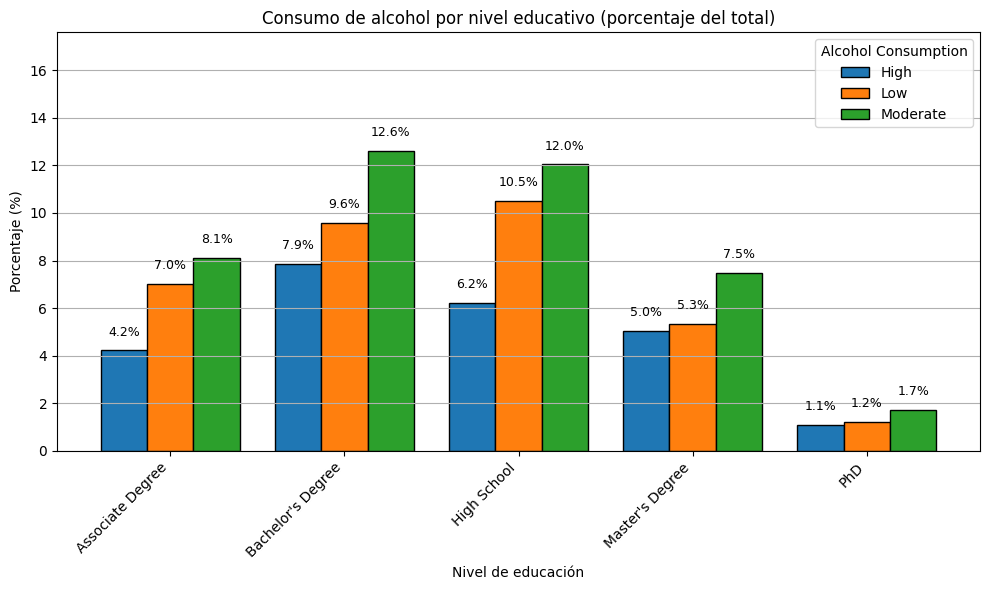

In [ ]:
import matplotlib.pyplot as plt

# Contar la frecuencia de cada categoría de consumo de alcohol por nivel de educación
conteo_categorias = df_combinado.groupby(["Education Level", "Alcohol Consumption"]).size().unstack().fillna(0)

# Calcular los porcentajes del total de los datos
total_datos = df_combinado.shape[0]
porcentajes_totales = conteo_categorias.div(total_datos) * 100

# ==== Calcular tamaño dinámico de la figura ====
num_niveles = len(porcentajes_totales.index)
max_porcentaje = porcentajes_totales.max().max()

# Ajustes dinámicos con mínimos razonables
fig_width = max(10, num_niveles * 1.5)
fig_height = max(6, (max_porcentaje / 5))  # escala de altura según porcentaje

fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Crear gráfico
porcentajes_totales.plot(kind='bar', ax=ax, edgecolor='black', width=0.8)

# Etiquetas sobre cada barra
# Calcular el número total de categorías para espaciamiento horizontal
n_cat = len(porcentajes_totales.columns)
bar_width = 0.8 / n_cat  # dividir el ancho total de barra entre categorías

for i, categoria in enumerate(porcentajes_totales.columns):
    for j, valor in enumerate(porcentajes_totales[categoria]):
        if valor > 0:
            # Calcular posición horizontal centrada para cada barra individual
            x = j - 0.4 + bar_width / 2 + i * bar_width
            ax.text(x, valor + 0.5, f'{valor:.1f}%', ha='center', va='bottom', fontsize=9)


# Configuración del gráfico
ax.set_title("Consumo de alcohol por nivel educativo (porcentaje del total)")
ax.set_xlabel("Nivel de educación")
ax.set_ylabel("Porcentaje (%)")
ax.set_ylim(0, max_porcentaje + 5)  # margen para que no se corten las etiquetas
ax.set_xticklabels(porcentajes_totales.index, rotation=45, ha='right')
ax.grid(True, axis='y')

plt.tight_layout()
plt.show()



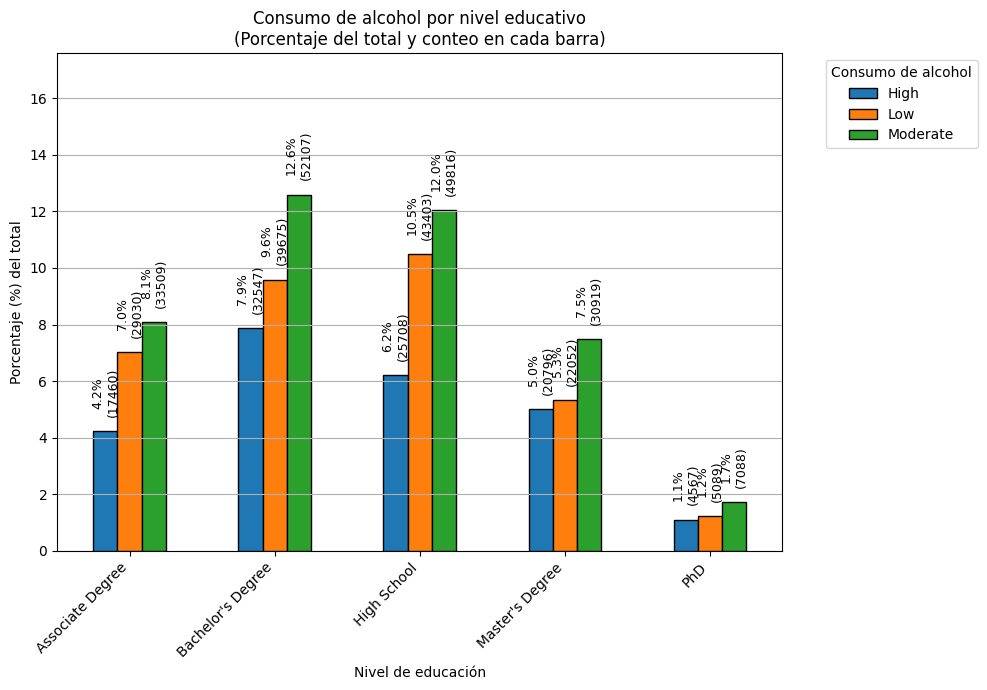

In [ ]:
import matplotlib.pyplot as plt

# ====== Preparar los datos ======

# Conteo por Education Level y Alcohol Consumption
conteo = df_combinado.groupby(["Education Level", "Alcohol Consumption"]).size().unstack(fill_value=0)

# Total general
total_general = conteo.values.sum()

# Porcentajes respecto al total general
porcentajes = conteo / total_general * 100

# ====== Ajuste dinámico de tamaño ======

num_categorias = len(conteo.index)
fig_width = max(10, num_categorias * 1.5)

fig, ax = plt.subplots(figsize=(fig_width, 7))

# ====== Gráfico ======

bars = porcentajes.plot(kind='bar', ax=ax, edgecolor='black')

# --- Ajustar el eje Y automáticamente al porcentaje máximo con un margen del 5%
max_pct = porcentajes.max().max()  # mayor porcentaje entre todas las categorías
ax.set_ylim(0, max_pct + 5)  # margen adicional para no cortar los textos

# Añadir etiquetas rotadas con porcentaje y total
for container in ax.containers:
    for bar in container:
        altura = bar.get_height()
        if altura > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_height()
            total_valor = int(total_general * (altura / 100))
            ax.text(x, y + 0.5, f'{altura:.1f}%\n({total_valor})', ha='center', va='bottom', fontsize=9, rotation=90)

# ====== Estética ======

ax.set_title("Consumo de alcohol por nivel educativo\n(Porcentaje del total y conteo en cada barra)")
ax.set_xlabel("Nivel de educación")
ax.set_ylabel("Porcentaje (%) del total")
ax.set_xticklabels(conteo.index, rotation=45, ha='right')
ax.legend(title="Consumo de alcohol", bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(axis='y')
plt.tight_layout()
plt.show()


<ipython-input-17-483d21a2e947>:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(conteo_personas.index, rotation=45, ha='right')
<ipython-input-17-483d21a2e947>:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(porcentajes.index, rotation=45, ha='right')


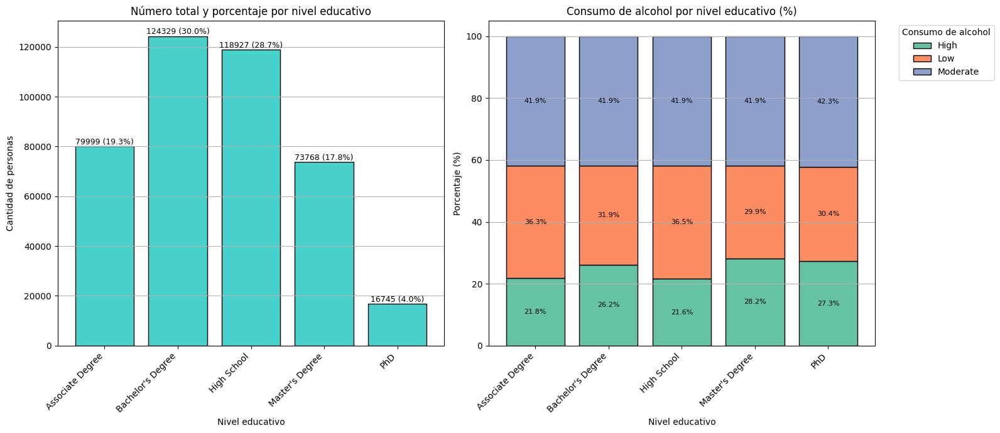

In [ ]:
import matplotlib.pyplot as plt

# ====== Preparar los datos ======

# 1. Conteo de categorías de alcohol por educación
conteo_categorias = df_combinado.groupby("Education Level")["Alcohol Consumption"].value_counts().unstack().fillna(0)

# 2. Porcentajes por nivel educativo
porcentajes = conteo_categorias.div(conteo_categorias.sum(axis=1), axis=0) * 100

# 3. Conteo total de personas por nivel educativo
conteo_personas = df_combinado.groupby("Education Level").size()

# 4. Total general para calcular porcentajes
total_general = conteo_personas.sum()

# 5. Asegurar orden consistente
education_order = conteo_personas.index  # o sorted(porcentajes.index)
porcentajes = porcentajes.loc[education_order]
conteo_personas = conteo_personas.loc[education_order]

# ====== Crear los gráficos ======

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# --- Gráfico 1: Conteo total + porcentaje por nivel educativo
bars = axes[0].bar(conteo_personas.index, conteo_personas.values, color='mediumturquoise', edgecolor='black')

# Etiquetas sobre las barras
for i, bar in enumerate(bars):
    cantidad = conteo_personas.values[i]
    porcentaje = (cantidad / total_general) * 100
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
                 f'{cantidad} ({porcentaje:.1f}%)', ha='center', va='bottom', fontsize=9)

axes[0].set_title("Número total y porcentaje por nivel educativo")
axes[0].set_ylabel("Cantidad de personas")
axes[0].set_xlabel("Nivel educativo")
axes[0].set_xticklabels(conteo_personas.index, rotation=45, ha='right')
axes[0].grid(axis='y')

# --- Gráfico 2: Barras apiladas de porcentajes por categoría de alcohol
colores = plt.get_cmap('Set2').colors
bottom = [0] * len(porcentajes)

for i, categoria in enumerate(porcentajes.columns):
    valores = porcentajes[categoria].values
    axes[1].bar(porcentajes.index, valores, bottom=bottom, label=categoria, color=colores[i % len(colores)], edgecolor='black')

    for j, (valor, b) in enumerate(zip(valores, bottom)):
        if valor > 0:
            axes[1].text(j, b + valor / 2, f'{valor:.1f}%', ha='center', va='center', fontsize=8)

    bottom = [b + v for b, v in zip(bottom, valores)]

axes[1].set_title("Consumo de alcohol por nivel educativo (%)")
axes[1].set_ylabel("Porcentaje (%)")
axes[1].set_xlabel("Nivel educativo")
axes[1].set_xticklabels(porcentajes.index, rotation=45, ha='right')
axes[1].grid(axis='y')
axes[1].legend(title="Consumo de alcohol", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


# Preprocesamiento de datos

Para mantener los datos originales se crea otra variable llama df_original

In [ ]:
df_original = df_combinado.copy()

Aquí se transforman los datos de categóricos a numéricos

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Cargar tus datos (simulado aquí, reemplaza por tu DataFrame real)
# df_sql = pd.read_sql("SELECT * FROM depression", conn)

# Selecciona solo las columnas categóricas excepto 'Name' e 'Income'
variables_a_transformar = [
    col for col in df_combinado.select_dtypes(include='object').columns
    if col not in ['Name', 'Income']
]

# Crear una copia del DataFrame para no modificar el original
df_transformado = df_combinado.copy()

# Guardar los mapeos
mapeos = {}

# Aplicar LabelEncoder y guardar el mapeo
for col in variables_a_transformar:
    le = LabelEncoder()
    df_transformado[col] = le.fit_transform(df_transformado[col].astype(str))
    mapeos[col] = dict(zip(le.classes_, le.transform(le.classes_)))

# Mostrar los primeros valores transformados
print(df_transformado.head())

# Mostrar los mapeos de transformación
for col, mapping in mapeos.items():
    print(f"\nVariable: {col}")
    for categoria, valor in mapping.items():
        print(f"  {categoria} --> {valor}")


               Name  Age  Marital Status  Education Level  Number of Children  \
0  Christine Barker   31               1                1                   2   
1  Jacqueline Lewis   55               1                2                   1   
2    Shannon Church   78               3                3                   1   
3    Charles Jordan   58               0                3                   3   
4      Michael Rich   18               2                2                   0   

   Smoking Status  Physical Activity Level  Employment Status     Income  \
0               2                        0                  1   26265.67   
1               2                        2                  0   42710.36   
2               2                        2                  0  125332.79   
3               2                        1                  1    9992.78   
4               2                        2                  1    8595.08   

   Alcohol Consumption  Dietary Habits  Sleep Patterns  

In [ ]:
print(mapeos)

{'Marital Status': {'Divorced': np.int64(0), 'Married': np.int64(1), 'Single': np.int64(2), 'Widowed': np.int64(3)}, 'Education Level': {'Associate Degree': np.int64(0), "Bachelor's Degree": np.int64(1), 'High School': np.int64(2), "Master's Degree": np.int64(3), 'PhD': np.int64(4)}, 'Smoking Status': {'Current': np.int64(0), 'Former': np.int64(1), 'Non-smoker': np.int64(2)}, 'Physical Activity Level': {'Active': np.int64(0), 'Moderate': np.int64(1), 'Sedentary': np.int64(2)}, 'Employment Status': {'Employed': np.int64(0), 'Unemployed': np.int64(1)}, 'Alcohol Consumption': {'High': np.int64(0), 'Low': np.int64(1), 'Moderate': np.int64(2)}, 'Dietary Habits': {'Healthy': np.int64(0), 'Moderate': np.int64(1), 'Unhealthy': np.int64(2)}, 'Sleep Patterns': {'Fair': np.int64(0), 'Good': np.int64(1), 'Poor': np.int64(2)}, 'History of Mental Illness': {'No': np.int64(0), 'Yes': np.int64(1)}, 'History of Substance Abuse': {'No': np.int64(0), 'Yes': np.int64(1)}, 'Family History of Depression': {

In [ ]:
df_combinado.head()

,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Christine Barker,31,Married,Bachelor's Degree,2,Non-smoker,Active,Unemployed,26265.67,Moderate,Moderate,Fair,Yes,No,Yes,Yes
1,Jacqueline Lewis,55,Married,High School,1,Non-smoker,Sedentary,Employed,42710.36,High,Unhealthy,Fair,Yes,No,No,Yes
2,Shannon Church,78,Widowed,Master's Degree,1,Non-smoker,Sedentary,Employed,125332.79,Low,Unhealthy,Good,No,No,Yes,No
3,Charles Jordan,58,Divorced,Master's Degree,3,Non-smoker,Moderate,Unemployed,9992.78,Moderate,Moderate,Poor,No,No,No,No
4,Michael Rich,18,Single,High School,0,Non-smoker,Sedentary,Unemployed,8595.08,Low,Moderate,Fair,Yes,No,Yes,Yes


In [ ]:
df_transformado.head()

,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Christine Barker,31,1,1,2,2,0,1,26265.67,2,1,0,1,0,1,1
1,Jacqueline Lewis,55,1,2,1,2,2,0,42710.36,0,2,0,1,0,0,1
2,Shannon Church,78,3,3,1,2,2,0,125332.79,1,2,1,0,0,1,0
3,Charles Jordan,58,0,3,3,2,1,1,9992.78,2,1,2,0,0,0,0
4,Michael Rich,18,2,2,0,2,2,1,8595.08,1,1,0,1,0,1,1


# Criterio para asumir depresión (si se cumple alguna de estas condiciones):

In [ ]:
# Crear variable objetivo "Depression" para verificar los datos ingresados
df_transformado["Depression"] = (
    (df_transformado["History of Mental Illness"] == 1) |
    (df_transformado["History of Substance Abuse"] == 1) |
    (df_transformado["Family History of Depression"] == 1) |
    (df_transformado["Sleep Patterns"] == 0) | # Suponiendo que 0 = sueño deficiente
    (df_transformado["Chronic Medical Conditions"] >= 1)
).astype(int)

# Verificar cuántas personas fueron clasificadas como con/sin depresión
print(df_transformado["Depression"].value_counts())


Depression
1    362601
0     51167
Name: count, dtype: int64


# Entrenamiento

Preparo los datos

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Variables a usar como predictores (excluimos Name e Income)
features = df_transformado.drop(columns=["Name", "Depression"]).columns.tolist()

# Definir X (predictoras) e y (variable objetivo)
X = df_transformado[features]
y = df_transformado["Depression"]

# Dividir en conjunto de entrenamiento y prueba (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Árbol de desición

Entreno el modelo para el árbol

In [ ]:
# Inicializar y entrenar modelo
model = DecisionTreeClassifier(max_depth=4, random_state=42)
model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

Evaluo el modelo

In [ ]:
# Predicciones
y_pred = model.predict(X_test)

# Evaluación
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))
print("Precisión del modelo:", accuracy_score(y_test, y_pred))


Matriz de confusión:
 [[10357     0]
 [ 3713 68684]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.74      1.00      0.85     10357
           1       1.00      0.95      0.97     72397

    accuracy                           0.96     82754
   macro avg       0.87      0.97      0.91     82754
weighted avg       0.97      0.96      0.96     82754

Precisión del modelo: 0.9551320782077


Visualizo el árbol

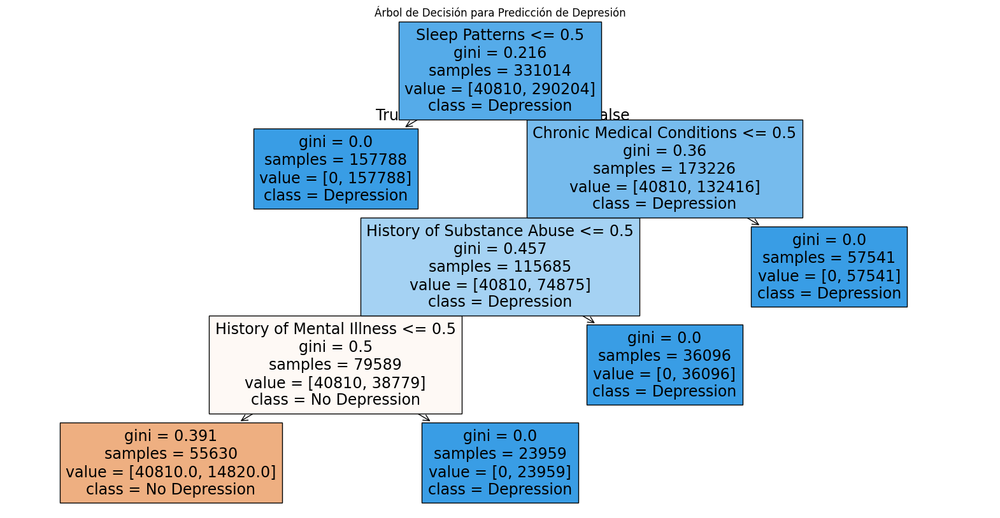

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(model, feature_names=features, class_names=["No Depression", "Depression"], filled=True)
plt.title("Árbol de Decisión para Predicción de Depresión")
plt.show()

# Random forest

=== Random Forest ===
[[10357     0]
 [    0 72397]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10357
           1       1.00      1.00      1.00     72397

    accuracy                           1.00     82754
   macro avg       1.00      1.00      1.00     82754
weighted avg       1.00      1.00      1.00     82754

Precisión del modelo RF es : 1.0


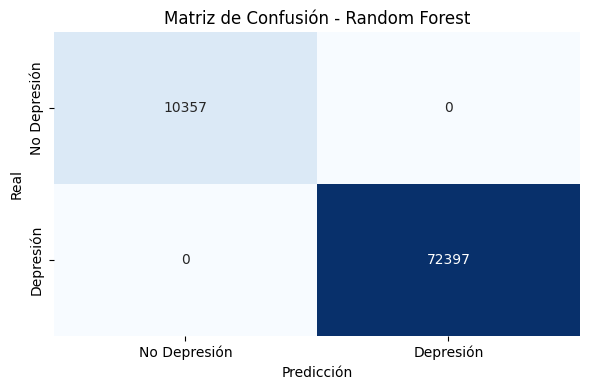

In [ ]:
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predicción y evaluación
y_pred_rf = rf_model.predict(X_test)
y_proba_rf = rf_model.predict_proba(X_test)

# Evaluar el modelo (precisión y otras métricas)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("=== Random Forest ===")
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))
print("Precisión del modelo RF es :", accuracy_rf)

# Obtener matriz de confusión
cmrf = confusion_matrix(y_test, y_pred_rf)

# Crear un gráfico tipo heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cmrf, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=["No Depresión", "Depresión"],
            yticklabels=["No Depresión", "Depresión"])
plt.title("Matriz de Confusión - Random Forest")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()


Guardamos el modelo

In [ ]:
import pickle

# Guardar el modelo Random Forest entrenado en un archivo 'rf_model.pkl'
with open('rf_model.pkl', 'wb') as f:
    pickle.dump(rf_model, f)

print("Modelo guardado en 'rf_model.pkl'")

Modelo guardado en 'rf_model.pkl'


# XGBoost

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [11:22:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


=== XGBoost ===
Precisión: 1.0000
[[10357     0]
 [    0 72397]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10357
           1       1.00      1.00      1.00     72397

    accuracy                           1.00     82754
   macro avg       1.00      1.00      1.00     82754
weighted avg       1.00      1.00      1.00     82754

La presición del modelo mediante XGBoost es:  1.0


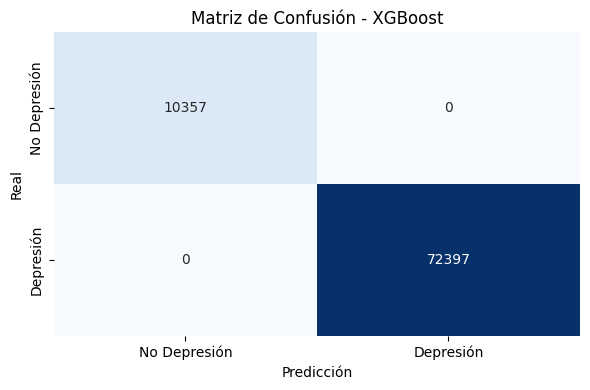

In [ ]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Predicción y evaluación
y_pred_xgb = xgb_model.predict(X_test)

# Evaluar el modelo (precisión y otras métricas)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("=== XGBoost ===")
print(f"Precisión: {accuracy_xgb:.4f}")
print(confusion_matrix(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))
print("La presición del modelo mediante XGBoost es: ", accuracy_xgb)

# Obtener matriz de confusión (ejemplo con XGBoost; puedes cambiar a y_pred_rf para Random Forest)
cmxgb = confusion_matrix(y_test, y_pred_xgb)

# Crear un gráfico tipo heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cmxgb, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=["No Depresión", "Depresión"],
            yticklabels=["No Depresión", "Depresión"])
plt.title("Matriz de Confusión - XGBoost")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()


# LigthGBoost

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 290204, number of negative: 40810
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 358
[LightGBM] [Info] Number of data points in the train set: 331014, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.876712 -> initscore=1.961657
[LightGBM] [Info] Start training from score 1.961657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

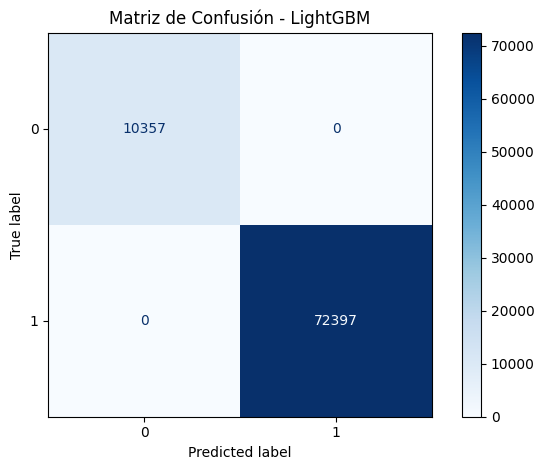

In [ ]:
import lightgbm as lgb

# Crear y entrenar el modelo LightGBM
lgb_model = lgb.LGBMClassifier(
    random_state=42,
    n_jobs=1,
    num_leaves=15,
    max_depth=4,
    n_estimators=100
)
lgb_model.fit(X_train, y_train)

# Predicción y evaluación
y_pred = lgb_model.predict(X_test)

# Métricas
accuracyligth = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracyligth:.2f}\n")
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("La presición del modelo mediante LigthBoost es: ", accuracyligth)

# Matriz de confusión como imagen
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d')
plt.title("Matriz de Confusión - LightGBM")
plt.grid(False)
plt.tight_layout()
plt.show()

# Probabilidad del modelo de Random Forest

In [ ]:
# Si los índices no coinciden, reseteamos el índice para que coincidan por posición:
df_reset = df.reset_index(drop=True)
X_test_reset = X_test.reset_index(drop=True)

# Creamos df_combinado con filas de df correspondientes a X_test
df_combinado = df_reset.loc[X_test_reset.index].copy()

# Agregamos la columna de probabilidad de depresión (probabilidad clase 1)
df_combinado['Probabilidad_Depresion'] = y_proba_rf[:, 1]*100


Comparamos la probabilidad con los datos actuales

In [ ]:
import pandas as pd
from IPython.core.display import display, HTML

# Mostrar solo las primeras 7 filas (se puede ajustar)
df_vista = df_combinado.head(7)

# Generar HTML con estilos personalizados
html_table = df_vista.to_html(classes='table table-striped table-bordered', index=False)

html_wrapper = f"""
<div style="overflow-x: auto; max-width: 100%;">
    <style>
        table {{
            border-collapse: collapse;
            min-width: 1600px; /* <- aquí se define un ancho mínimo amplio */
            table-layout: auto;
        }}
        th, td {{
            text-align: left;
            padding: 10px;
            white-space: nowrap;
            font-family: Arial, sans-serif;
            font-size: 14px;
        }}
        th {{
            background-color: #007BFF;
            color: white;
        }}
        tr:nth-child(even) {{
            background-color: #f2f2f2;
        }}
    </style>
    {html_table}
</div>
"""

# Mostrar en notebook
display(HTML(html_wrapper))



Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions,Probabilidad_Depresion
Christine Barker,31,Married,Bachelor's Degree,2,Non-smoker,Active,Unemployed,26265.67,Moderate,Moderate,Fair,Yes,No,Yes,Yes,100.0
Jacqueline Lewis,55,Married,High School,1,Non-smoker,Sedentary,Employed,42710.36,High,Unhealthy,Fair,Yes,No,No,Yes,100.0
Shannon Church,78,Widowed,Master's Degree,1,Non-smoker,Sedentary,Employed,125332.79,Low,Unhealthy,Good,No,No,Yes,No,100.0
Charles Jordan,58,Divorced,Master's Degree,3,Non-smoker,Moderate,Unemployed,9992.78,Moderate,Moderate,Poor,No,No,No,No,100.0
Michael Rich,18,Single,High School,0,Non-smoker,Sedentary,Unemployed,8595.08,Low,Moderate,Fair,Yes,No,Yes,Yes,100.0
Kathy Hill,20,Single,High School,0,Former,Active,Employed,44448.91,Low,Unhealthy,Fair,No,Yes,No,No,100.0
Crystal Delgado,60,Widowed,Associate Degree,1,Non-smoker,Sedentary,Unemployed,22565.47,Moderate,Moderate,Poor,No,Yes,No,No,0.0


Obtenemos la gráfica de "Probabilidad de Depresión vs Edad" conparando con los datos originales

In [ ]:
import plotly.express as px

fig = px.scatter(df_combinado, x='Age', y='Probabilidad_Depresion',
                 hover_data=df_combinado.columns,
                 title='Probabilidad de Depresión vs Edad',
                 labels={'Probabilidad_Depresion':'Probabilidad de Depresión (%)'})

fig.show()


Prueba con datos agregados de forma dinámica y utilizando el modelo

In [ ]:
import pandas as pd
import ipywidgets as widgets
from IPython.display import display
import pickle

# Cargar el modelo desde el archivo rf_model.pkl en Colab
with open('rf_model.pkl', 'rb') as f:
    rf_model = pickle.load(f)

# Diccionario de mapeo para variables categóricas
mapeo = {
    "Marital Status": {"Single": 0, "Married": 1, "Divorced": 2, "Widowed": 3},
    "Education Level": {"High School": 0, "Associate Degree": 1, "Bachelor's Degree": 2, "Master's Degree": 3, "PhD": 4},
    "Smoking Status": {"Non-smoker": 0, "Former": 1, "Smoker": 2},
    "Physical Activity Level": {"Sedentary": 0, "Moderate": 1, "Active": 2},
    "Employment Status": {"Unemployed": 0, "Employed": 1},
    "Alcohol Consumption": {"Low": 0, "Moderate": 1, "High": 2},
    "Dietary Habits": {"Healthy": 0, "Moderate": 1, "Unhealthy": 2},
    "Sleep Patterns": {"Good": 0, "Fair": 1, "Poor": 2},
    "History of Mental Illness": {"No": 0, "Yes": 1},
    "History of Substance Abuse": {"No": 0, "Yes": 1},
    "Family History of Depression": {"No": 0, "Yes": 1},
    "Chronic Medical Conditions": {"No": 0, "Yes": 1},
}

# Crear widgets para cada variable
widget_name = widgets.Text(description="Name:")
widget_age = widgets.IntText(description="Age:", value=30)

widget_marital_status = widgets.Dropdown(options=list(mapeo["Marital Status"].keys()), description="Marital Status:")
widget_education = widgets.Dropdown(options=list(mapeo["Education Level"].keys()), description="Education Level:")
widget_num_children = widgets.IntText(description="Number Children:", value=0)
widget_smoking = widgets.Dropdown(options=list(mapeo["Smoking Status"].keys()), description="Smoking Status:")
widget_physical_activity = widgets.Dropdown(options=list(mapeo["Physical Activity Level"].keys()), description="Physical Activity:")
widget_employment = widgets.Dropdown(options=list(mapeo["Employment Status"].keys()), description="Employment Status:")
widget_income = widgets.IntText(description="Income (USD):", value=30000)
widget_alcohol = widgets.Dropdown(options=list(mapeo["Alcohol Consumption"].keys()), description="Alcohol Consumption:")
widget_dietary = widgets.Dropdown(options=list(mapeo["Dietary Habits"].keys()), description="Dietary Habits:")
widget_sleep = widgets.Dropdown(options=list(mapeo["Sleep Patterns"].keys()), description="Sleep Patterns:")
widget_mental_illness = widgets.Dropdown(options=list(mapeo["History of Mental Illness"].keys()), description="History Mental Illness:")
widget_substance_abuse = widgets.Dropdown(options=list(mapeo["History of Substance Abuse"].keys()), description="History Substance Abuse:")
widget_family_history = widgets.Dropdown(options=list(mapeo["Family History of Depression"].keys()), description="Family History Depression:")
widget_chronic_conditions = widgets.Dropdown(options=list(mapeo["Chronic Medical Conditions"].keys()), description="Chronic Conditions:")

button_predict = widgets.Button(description="Predecir Depresión")
output = widgets.Output()

def on_button_clicked(b):
    with output:
        output.clear_output()

        # Crear diccionario con los valores ingresados y mapear categorías a números
        input_dict = {
            "Name": widget_name.value,
            "Age": widget_age.value,
            "Marital Status": mapeo["Marital Status"][widget_marital_status.value],
            "Education Level": mapeo["Education Level"][widget_education.value],
            "Number of Children": widget_num_children.value,
            "Smoking Status": mapeo["Smoking Status"][widget_smoking.value],
            "Physical Activity Level": mapeo["Physical Activity Level"][widget_physical_activity.value],
            "Employment Status": mapeo["Employment Status"][widget_employment.value],
            "Income": widget_income.value,
            "Alcohol Consumption": mapeo["Alcohol Consumption"][widget_alcohol.value],
            "Dietary Habits": mapeo["Dietary Habits"][widget_dietary.value],
            "Sleep Patterns": mapeo["Sleep Patterns"][widget_sleep.value],
            "History of Mental Illness": mapeo["History of Mental Illness"][widget_mental_illness.value],
            "History of Substance Abuse": mapeo["History of Substance Abuse"][widget_substance_abuse.value],
            "Family History of Depression": mapeo["Family History of Depression"][widget_family_history.value],
            "Chronic Medical Conditions": mapeo["Chronic Medical Conditions"][widget_chronic_conditions.value]
        }

        # Convertir a DataFrame
        df_input = pd.DataFrame([input_dict])

        # Orden de columnas esperado por el modelo (sin 'Name' que no se usa en predicción)
        columnas_modelo = ['Age', 'Marital Status', 'Education Level', 'Number of Children',
                          'Smoking Status', 'Physical Activity Level', 'Employment Status',
                          'Income', 'Alcohol Consumption', 'Dietary Habits', 'Sleep Patterns',
                          'History of Mental Illness', 'History of Substance Abuse',
                          'Family History of Depression', 'Chronic Medical Conditions']

        X_new = df_input[columnas_modelo]

        # Predecir la probabilidad con el modelo cargado
        prob_depresion = rf_model.predict_proba(X_new)[:,1][0]

        # Mostrar la probabilidad en porcentaje
        print(f"Probabilidad de depresión: {prob_depresion*100:.2f}%")

button_predict.on_click(on_button_clicked)

# Mostrar todos los widgets y el área de salida
display(
    widget_name,
    widget_age,
    widget_marital_status,
    widget_education,
    widget_num_children,
    widget_smoking,
    widget_physical_activity,
    widget_employment,
    widget_income,
    widget_alcohol,
    widget_dietary,
    widget_sleep,
    widget_mental_illness,
    widget_substance_abuse,
    widget_family_history,
    widget_chronic_conditions,
    button_predict,
    output
)


Text(value='', description='Name:')

IntText(value=30, description='Age:')

Dropdown(description='Marital Status:', options=('Single', 'Married', 'Divorced', 'Widowed'), value='Single')

Dropdown(description='Education Level:', options=('High School', 'Associate Degree', "Bachelor's Degree", "Mas…

IntText(value=0, description='Number Children:')

Dropdown(description='Smoking Status:', options=('Non-smoker', 'Former', 'Smoker'), value='Non-smoker')

Dropdown(description='Physical Activity:', options=('Sedentary', 'Moderate', 'Active'), value='Sedentary')

Dropdown(description='Employment Status:', options=('Unemployed', 'Employed'), value='Unemployed')

IntText(value=30000, description='Income (USD):')

Dropdown(description='Alcohol Consumption:', options=('Low', 'Moderate', 'High'), value='Low')

Dropdown(description='Dietary Habits:', options=('Healthy', 'Moderate', 'Unhealthy'), value='Healthy')

Dropdown(description='Sleep Patterns:', options=('Good', 'Fair', 'Poor'), value='Good')

Dropdown(description='History Mental Illness:', options=('No', 'Yes'), value='No')

Dropdown(description='History Substance Abuse:', options=('No', 'Yes'), value='No')

Dropdown(description='Family History Depression:', options=('No', 'Yes'), value='No')

Dropdown(description='Chronic Conditions:', options=('No', 'Yes'), value='No')

Button(description='Predecir Depresión', style=ButtonStyle())

Output()